This notebook's purpose is to be a sandbox for playing with and learning how to use various image recognition and computer vision tools. I'll start with some sections will follow [pyimagelearning tutorials](https://www.pyimagesearch.com/2016/02/08/opencv-shape-detection/).

In [111]:
# core
import sys, os, re, argparse
import numpy as np
import pandas as pd
# plotting
import matplotlib.pyplot as plt
%matplotlib inline
from IPython.display import Image
# image recognition
import cv2
import imutils
import PIL.Image
from pytesseract import image_to_string
import pytesseract

## OpenCV center of contour
Here is the `shapes_and_colors.jpg` image I'll be working with.

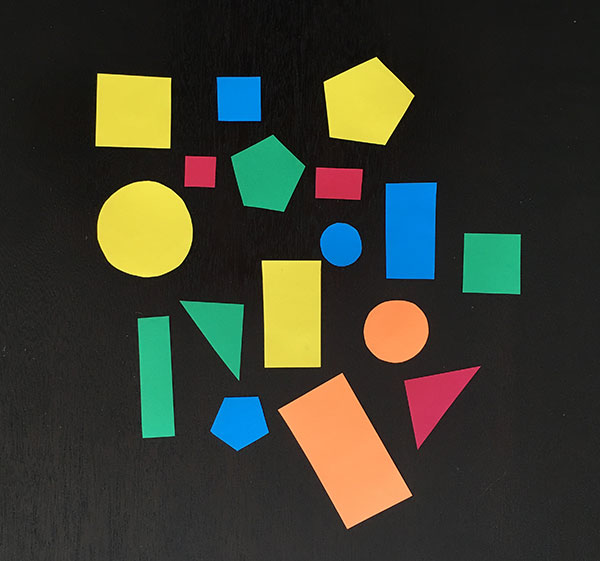

In [112]:
Image(filename="../Data/sandbox_data/shapes_and_colors.jpg", width=500)

**Goals**
1. detect the outline of each shape in the image
2. compute the center of the contour — also called the centroid of the region.

**Steps**
1. Convert to grayscale.
2. Blur to reduce high frequency noise to make our contour detection process more accurate.
3. Binarize of the image. Typically edge detection and thresholding are used for this process.

In [113]:
image = cv2.imread("../Data/Calindrinia/C_spergularina_lph133_A16_LD_1778_14_step2.tif")
# image = cv2.imread(filename="../Data/C3_images/33.1_10x_D.jpg")
shapes = cv2.imread("../Data/sandbox_data/shapes_and_colors.jpg")

grayshapes = cv2.cvtColor(shapes, cv2.COLOR_BGR2GRAY)
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

blurredshapes = cv2.GaussianBlur(grayshapes, (5, 5), 0)
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

threshshapes = cv2.threshold(src=blurredshapes, thresh=60, maxval=255, type=cv2.THRESH_BINARY)[1]
thresh = cv2.threshold(src=blurred, thresh=60, maxval=255, type=cv2.THRESH_BINARY)[1]

C, blocksize = 2, 5

MAthresh = cv2.adaptiveThreshold(src=blurredshapes, maxValue=255, adaptiveMethod=cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                thresholdType=cv2.THRESH_BINARY, blockSize=blocksize, C=C)
MAthresh = cv2.adaptiveThreshold(src=blurred, maxValue=255, adaptiveMethod=cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                thresholdType=cv2.THRESH_BINARY, blockSize=blocksize, C=C)

GAthresh = cv2.adaptiveThreshold(src=blurredshapes, maxValue=255, adaptiveMethod=cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                thresholdType=cv2.THRESH_BINARY, blockSize=blocksize, C=C)
GAthresh = cv2.adaptiveThreshold(src=blurred, maxValue=255, adaptiveMethod=cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                thresholdType=cv2.THRESH_BINARY, blockSize=blocksize, C=C)

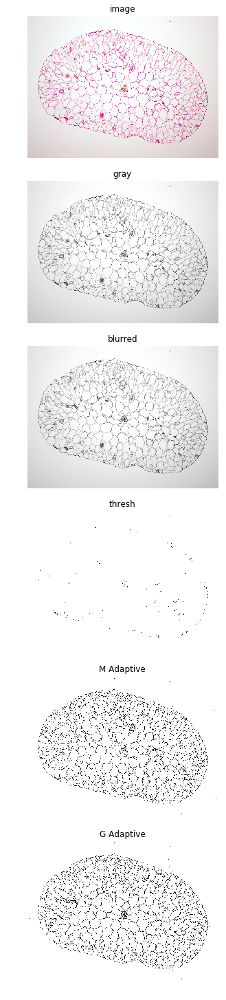

In [114]:
images = [image, gray, blurred, thresh, MAthresh, GAthresh]
titles = ["image", "gray", "blurred", "thresh", "M Adaptive", "G Adaptive"]

fig, ax = plt.subplots(nrows=len(images), ncols=1, figsize=(20, 20))

for i, title in enumerate(titles):
    ax[i].imshow(images[i], vmin=0, vmax=255, cmap="gray")
    ax[i].axis('off')
    ax[i].set_title(titles[i])
    
plt.tight_layout(pad=0.0, h_pad=0.0, w_pad=-2.0)

Now to get the contours and plot.

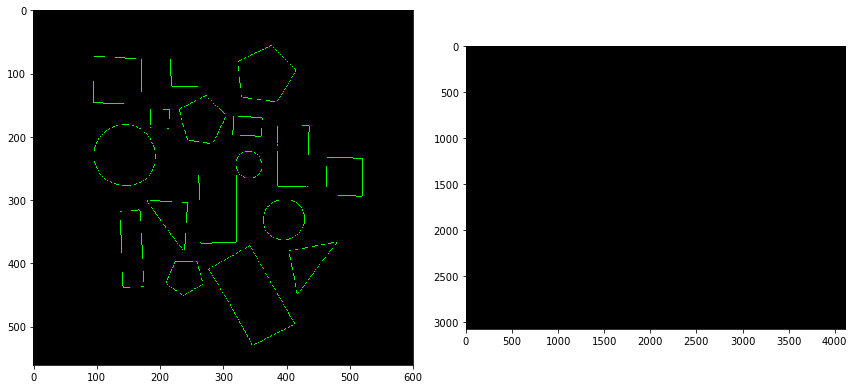

In [115]:
contoursshapes = cv2.findContours(threshshapes.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contoursshapes = imutils.grab_contours(contoursshapes)

contours = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contours = imutils.grab_contours(contours)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))
canvasshapes = np.zeros_like(shapes)
cv2.drawContours(canvasshapes, contoursshapes, -1, (0, 255, 0), 1)
ax[0].imshow(canvasshapes)

canvas = np.zeros_like(image)
cv2.drawContours(canvas, contours, -1, (0, 255, 0), 1)
ax[1].imshow(canvas)
plt.tight_layout()

**Code below will take a long time to run with current image. Use with shape image only**

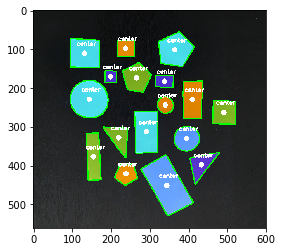

In [116]:
MIN_THRESH = 1
# loop over the contours
for c in contoursshapes:
    if cv2.contourArea(c) > MIN_THRESH:
        # process the contour
        # compute the center of the contour
        M = cv2.moments(c)
        cX = int(M["m10"] / M["m00"])
        cY = int(M["m01"] / M["m00"])

        # draw the contour and center of the shape on the image
        cv2.drawContours(shapes, [c], -1, (0, 255, 0), 2)
        cv2.circle(shapes, (cX, cY), 7, (255, 255, 255), -1)
        cv2.putText(shapes, "center", (cX - 20, cY - 20),
        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)

        # show the image
        plt.imshow(shapes)

Now trying to follow [this post](https://stackoverflow.com/questions/46036172/irregular-shape-detection-and-measurement-in-python-opencv).

Some notes on HSV

- **H**ue is the color portion of the color model, expressed as a number from 0 to 360 degrees:
 - Red	0–60
 - Yellow	60-–20
 - Green	120–180
 - Cyan	180–240
 - Blue	240–300
 - Magenta	300–360
 
- **S**aturation is the amount of gray in the color, from 0 to 100 percent. Reducing the saturation toward zero to introduce more gray produces a faded effect. Sometimes, saturation is expressed in a range from just 0-1, where 0 is gray and 1 is a primary color.

- **V**alue (or Brightness) works in conjunction with saturation and describes the brightness or intensity of the color, from 0-100 percent, where 0 is completely black, and 100 is the brightest and reveals the most color.

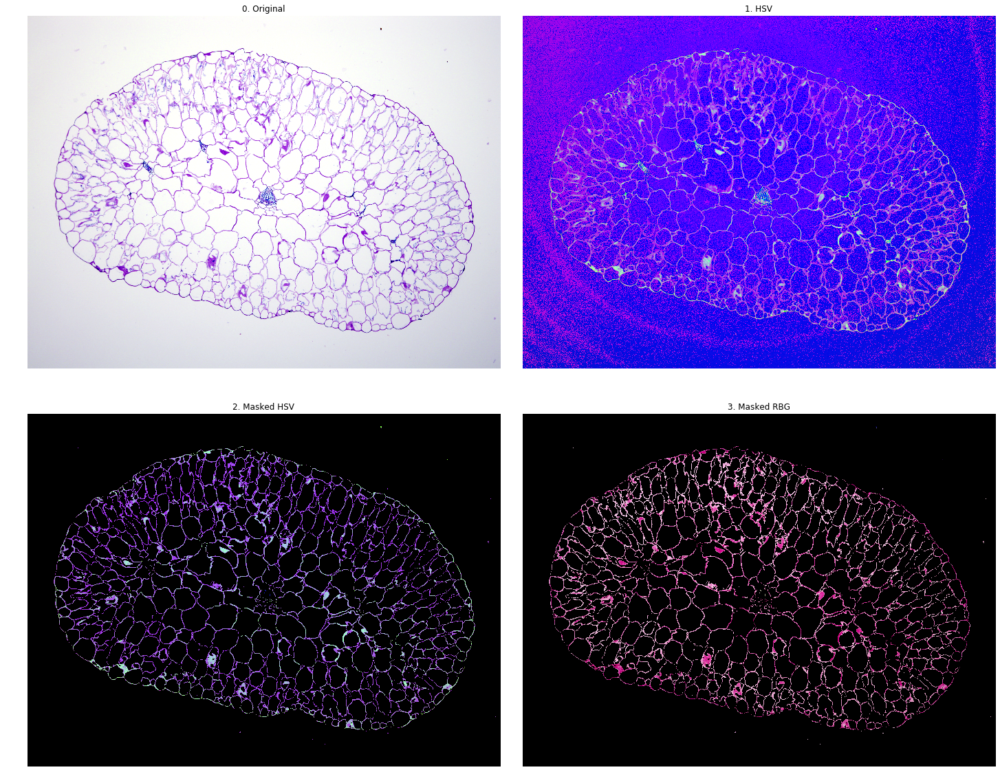

In [117]:
image = cv2.imread("../Data/Calindrinia/C_spergularina_lph133_A16_LD_1778_14_step2.tif")

height, width = image.shape[:2]
# Convert to BGR, which is standard for openCV
BGR = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

# Convert to HSV for selecting channels
HSV = cv2.cvtColor(BGR.copy(), cv2.COLOR_BGR2HSV)
# Mask channel values
mask = cv2.inRange(src=HSV.copy(), lowerb=np.array([30,30,30]), upperb=np.array([165,255,255]))
masked=cv2.bitwise_and(src1=HSV.copy(), src2=HSV.copy(), mask=mask)
# Convert back to RGB
RGB=cv2.cvtColor(src=masked.copy(), code=cv2.COLOR_HSV2RGB)

fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(20,20))
ax[0,0].imshow(BGR)
ax[0,0].set_title("0. Original")

ax[0,1].imshow(HSV)
ax[0,1].set_title("1. HSV")

ax[1,0].imshow(masked)
ax[1,0].set_title("2. Masked HSV")

ax[1,1].imshow(RGB)
ax[1,1].set_title("3. Masked RBG")

for i in range(2): 
    for j in range(2):
        ax[i,j].axis("off")
    
plt.tight_layout(pad=0.0, h_pad=-20.0)

Currently I'm having better results using the original image instead of the masked HSV. Not exactly sure why, since the features seem more distinction on the HSV.

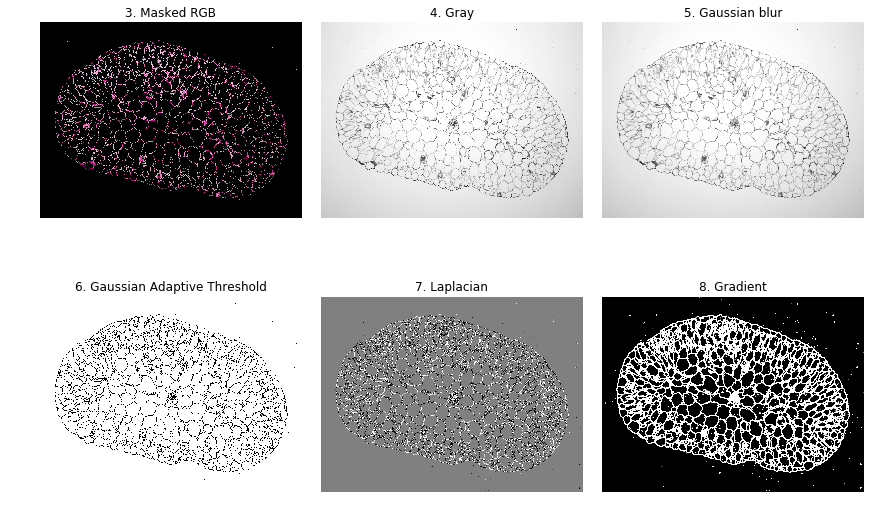

In [118]:
# image = cv2.imread(filename="../Data/C3_images/33.1_10x_D.jpg")
"""Gray"""
gray = cv2.cvtColor(src = image.copy(), code=cv2.COLOR_RGB2GRAY)

# Kernel size for blurring in pizels
k_blur = 9
"""Blur"""
blur = cv2.GaussianBlur(src=gray, ksize=(k_blur, k_blur), sigmaX=2)
# edged = cv2.Canny(blur, threshold1 = 0, threshold2=100)
# dilate = cv2.dilate(edged, None, iterations=1)
# Constant subtracted from the mean or weighted mean
C = 3
# Neighborhood size in pixel for calculating threshold
blocksize = 15
"""Adaptive Gaussian threshold"""
thresh = cv2.adaptiveThreshold(src=blur, maxValue=255, adaptiveMethod=cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                               thresholdType=cv2.THRESH_BINARY, blockSize=blocksize, C=C)
"""Laplacian"""
k_laplacian = 7
laplacian = cv2.Laplacian(src=thresh, ddepth=cv2.CV_16S, ksize=k_laplacian)

"""Morphological gradient"""
# Kernel size for blurring in pizels
k_gradient = 3
kernel = cv2.getStructuringElement(shape=cv2.MORPH_RECT, ksize=(k_gradient, k_gradient))
gradient = cv2.morphologyEx(laplacian, cv2.MORPH_GRADIENT, kernel=kernel, iterations=3)

# Plotting
fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(12,8))
ax[0,0].imshow(RGB)
ax[0,0].set_title("3. Masked RGB")

ax[0,1].imshow(gray, cmap="gray")
ax[0,1].set_title("4. Gray")

ax[0,2].imshow(blur, cmap="gray")
ax[0,2].set_title("5. Gaussian blur")

ax[1,0].imshow(thresh, cmap="gray")
ax[1,0].set_title("6. Gaussian Adaptive Threshold")

ax[1,1].imshow(laplacian, cmap="gray")
ax[1,1].set_title("7. Laplacian")

ax[1,2].imshow(gradient, cmap="gray")
ax[1,2].set_title("8. Gradient")

for i in range(2):
    for j in range(3):
        ax[i,j].axis("off")
plt.tight_layout(pad=0.0, h_pad=-1.0, w_pad=-2.0)

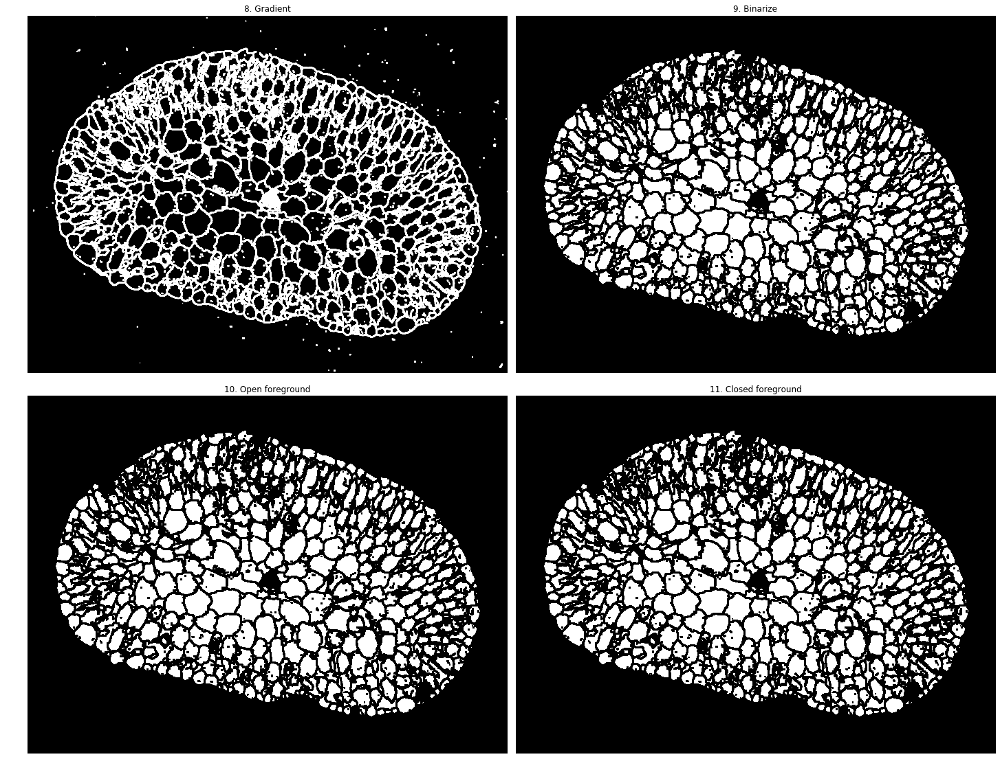

In [119]:
"""Binarize gradient"""
binary = cv2.inRange(gradient, lowerb=np.array([0]), upperb=np.array([5]))

"""Flood fill from the edges"""
for row in range(height):
    if binary[row, 0] == 255:
        cv2.floodFill(binary, None, (0, row), 0)
    if binary[row, width-1] == 255:
        cv2.floodFill(binary, None, (width-1, row), 0)

for col in range(width):
    if binary[0, col] == 255:
        cv2.floodFill(binary, None, (col, 0), 0)
    if binary[height-1, col] == 255:
        cv2.floodFill(binary, None, (col, height-1), 0)

"""Cleaning up mask"""
foreground_open = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel=kernel, iterations=1)
foreground_closed = cv2.morphologyEx(foreground_open, cv2.MORPH_CLOSE, kernel=kernel, iterations=1)

fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(20,20))
ax[0,0].imshow(gradient, cmap="gray")
ax[0,0].set_title("8. Gradient")

ax[0,1].imshow(binary, cmap="gray")
ax[0,1].set_title("9. Binarize")

ax[1,0].imshow(foreground_open, cmap="gray")
ax[1,0].set_title("10. Open foreground")

ax[1,1].imshow(foreground_closed, cmap="gray")
ax[1,1].set_title("11. Closed foreground")

for i in range(2):
    for j in range(2):
        ax[i,j].axis("off")
plt.tight_layout(pad=0.0, h_pad=-25.0, w_pad=-2.0)

I tried using `mode=cv2.RETR_TREE` instead of `cv2.RETR_EXTERNAL`, below, but it includes many more small contours within larger contours. This method works much better compared to other `cv2.RET_*` modes.

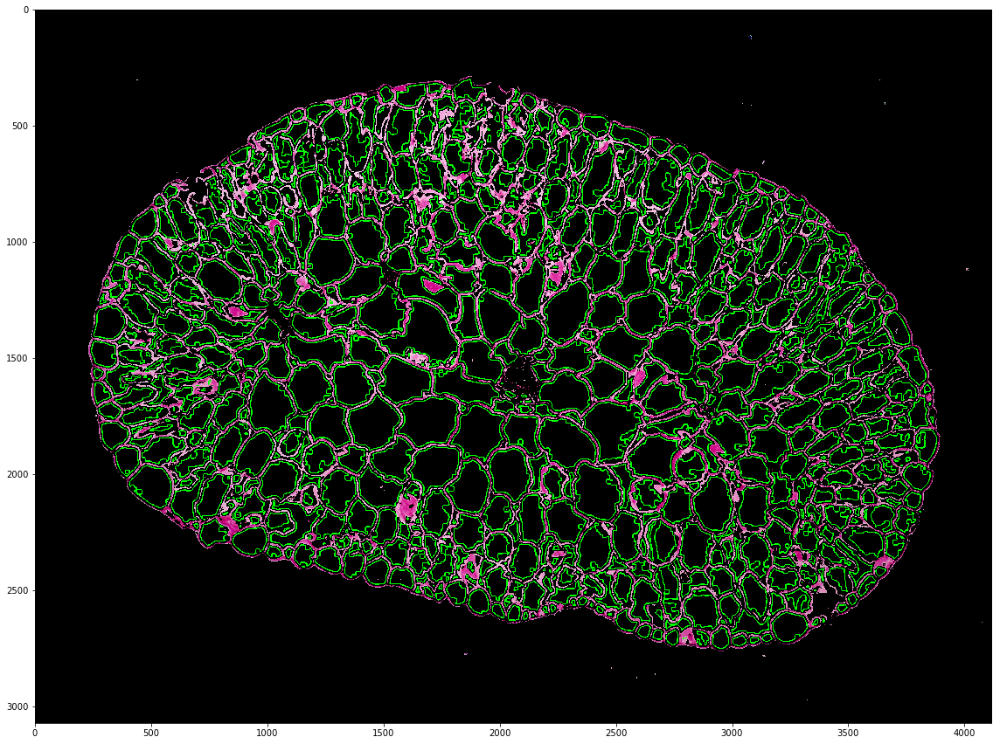

In [120]:
contours, hierarchy = cv2.findContours(image=foreground_closed, mode=cv2.RETR_EXTERNAL, 
                                       method=cv2.CHAIN_APPROX_SIMPLE)

fig, ax = plt.subplots(figsize=(16,16))
drawn_contours = cv2.drawContours(image=RGB.copy(), contours=contours, 
                                  contourIdx=-1, color=(0,255,0), thickness=3)
plt.imshow(drawn_contours, )
plt.tight_layout()

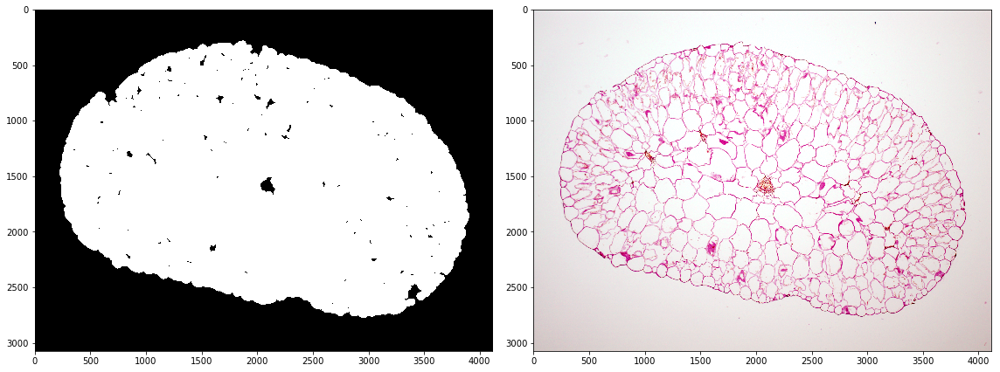

In [121]:
"""Creating background and unknown mask for labeling"""
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (17, 17))
background = cv2.dilate(foreground_closed, kernel, iterations=3)
unknown = cv2.subtract(background, foreground_closed)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16,16))
ax[0].imshow(background, cmap="gray")
ax[1].imshow(image)
plt.tight_layout()

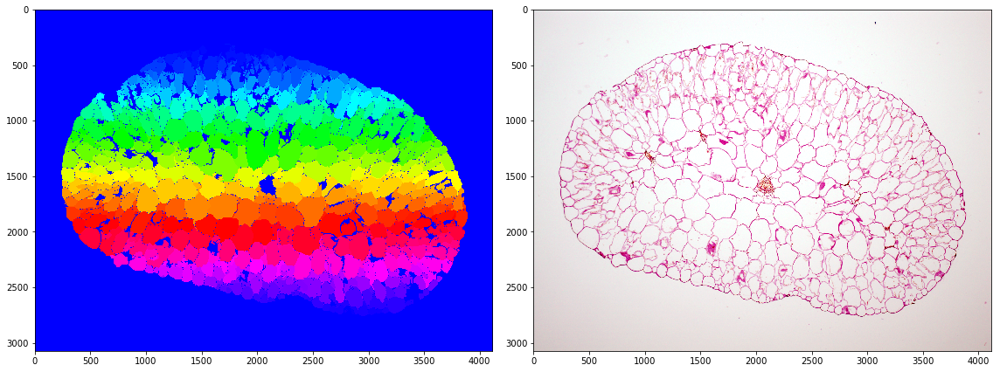

In [122]:
"""Watershed"""
markers = cv2.connectedComponents(foreground_closed)[1]
markers += 1  # Add one to all labels so that background is 1, not 0
markers[unknown==255] = 0  # mark the region of unknown with zero
markers = cv2.watershed(image, markers)

"""Assign the markers a hue between 0 and 179"""

hue_markers = np.uint8(179*np.float32(markers)/np.max(markers))
blank_channel = 255*np.ones((height, width), dtype=np.uint8)
marker_img = cv2.merge([hue_markers, blank_channel, blank_channel])
marker_img = cv2.cvtColor(marker_img, cv2.COLOR_HSV2BGR)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16,16))
ax[0].imshow(marker_img, cmap="gray")
ax[1].imshow(image)
plt.tight_layout()

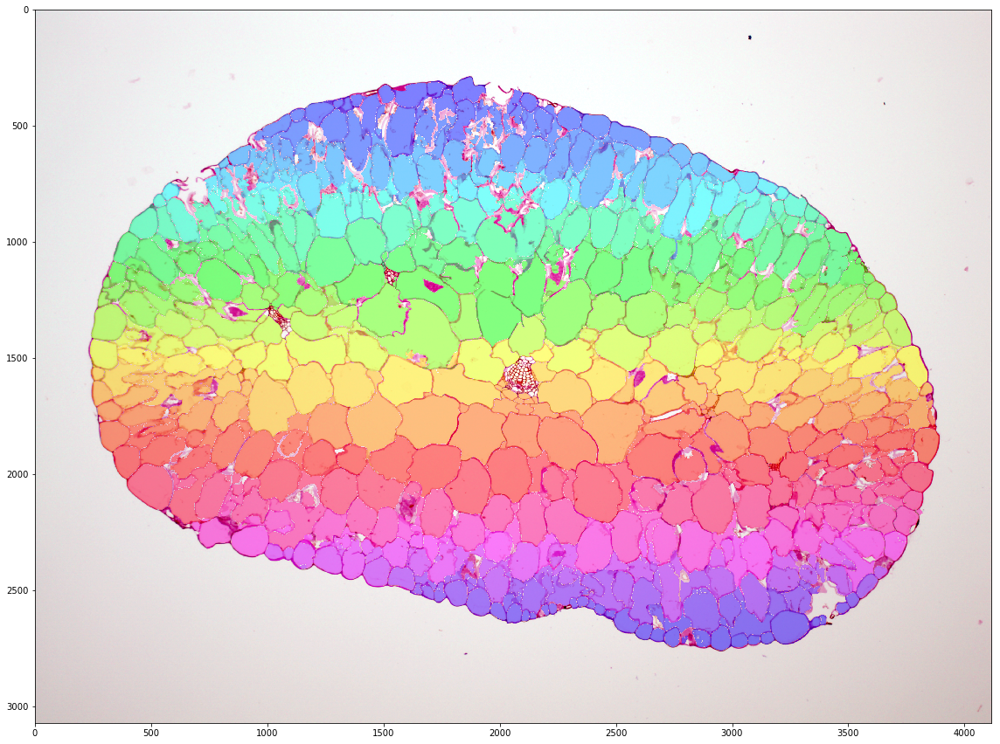

In [123]:
"""Label the original image with the watershed markers"""
labeled_img = image.copy()
labeled_img[markers>1] = marker_img[markers>1]  # 1 is background color
labeled_img = cv2.addWeighted(image, 0.5, labeled_img, 0.5, 0)

fig, ax = plt.subplots(figsize=(16,16))
ax.imshow(labeled_img)
plt.tight_layout()

In [124]:
careas = [cv2.contourArea(c) for c in contours]
print(len(careas), np.argmax(careas))

884 512


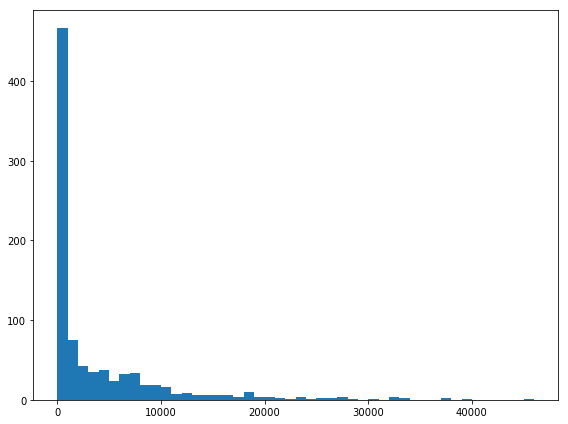

In [125]:
fig, ax = plt.subplots(figsize=(8,6))

binwidth=1000

plt.hist(careas, bins=range(int(min(careas)), int(max(careas)) + binwidth, binwidth))

plt.tight_layout()

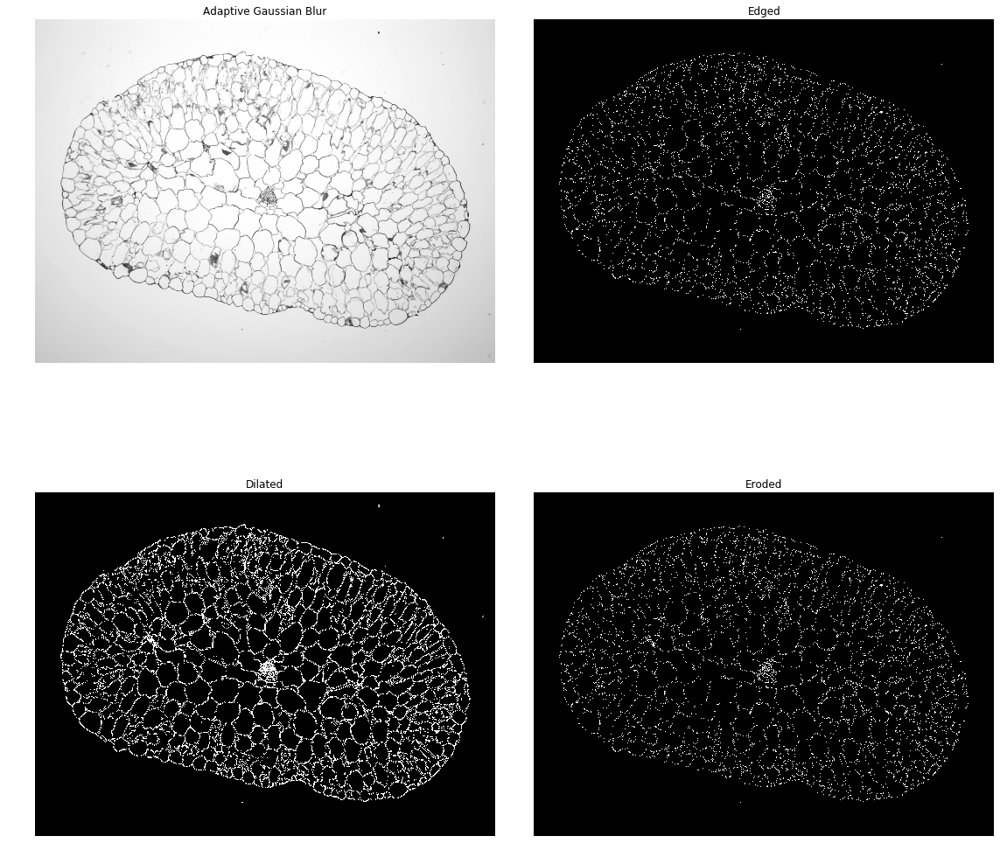

In [126]:
edged = cv2.Canny(blur, threshold1 = 50, threshold2=100)
dilate = cv2.dilate(edged, None, iterations=1)
erode = cv2.erode(dilate, None, iterations=1)

fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(16,16))
ax[0,0].imshow(blur, cmap="gray")
ax[0,0].set_title("Adaptive Gaussian Blur")

ax[0,1].imshow(edged, cmap="gray")
ax[0,1].set_title("Edged")

ax[1,0].imshow(dilate, cmap="gray")
ax[1,0].set_title("Dilated")

ax[1,1].imshow(erode, cmap="gray")
ax[1,1].set_title("Eroded")

for i in range(2):
    for j in range(2):
        ax[i,j].axis("off")

plt.tight_layout()

## Scale bar detection
Following the line detecting aspects of [this post](https://stackoverflow.com/questions/45322630/how-to-detect-lines-in-opencv).

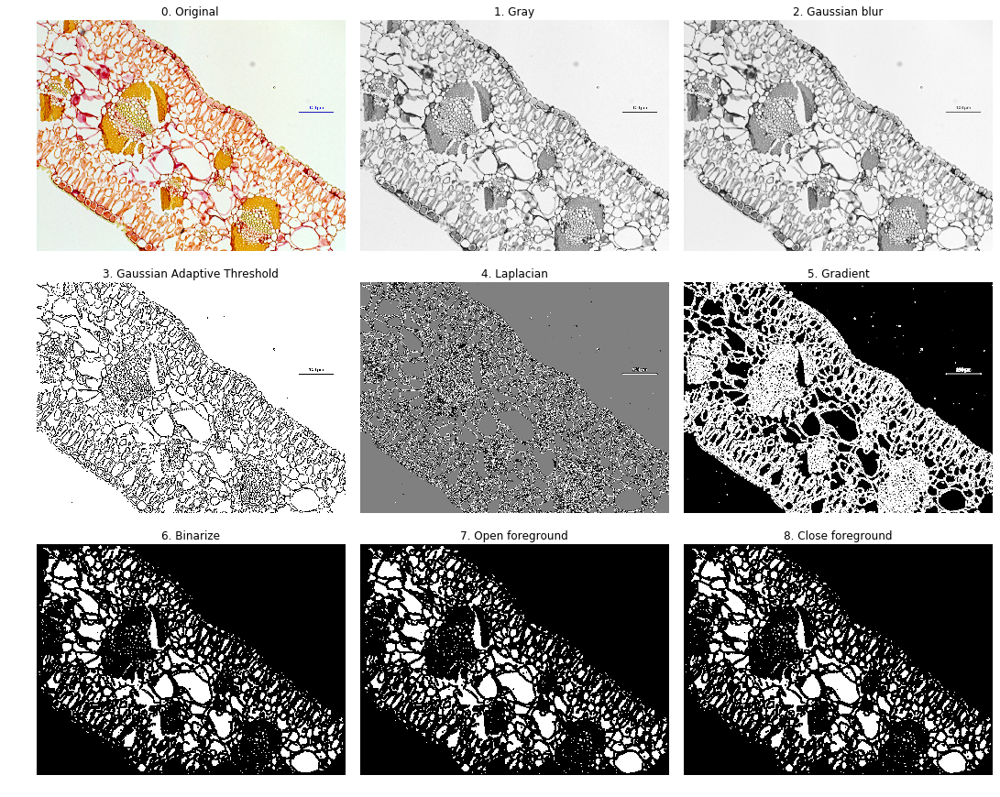

In [150]:
"""0. Original"""
image = cv2.imread("../Data/C3_images/3.2_10x.jpg")
height, width = image.shape[:2]

"""Convert to BGR"""
BGR = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

"""1. Gray"""
gray = cv2.cvtColor(src = image.copy(), code=cv2.COLOR_RGB2GRAY)

"""2. Blur"""
# Kernel size for blurring in pizels
k_blur = 5
blur = cv2.GaussianBlur(src=gray, ksize=(k_blur, k_blur), sigmaX=2)
# edged = cv2.Canny(blur, threshold1 = 0, threshold2=100)
# dilate = cv2.dilate(edged, None, iterations=1)

"""3. Adaptive Gaussian threshold"""
# Constant subtracted from the mean or weighted mean
C = 3
# Neighborhood size in pixel for calculating threshold
blocksize = 15
thresh = cv2.adaptiveThreshold(src=blur, maxValue=255, adaptiveMethod=cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                               thresholdType=cv2.THRESH_BINARY, blockSize=blocksize, C=C)
"""4. Laplacian"""
k_laplacian = 7
laplacian = cv2.Laplacian(src=thresh, ddepth=cv2.CV_16S, ksize=k_laplacian)

"""5. Morphological gradient"""
# Kernel size for blurring in pizels
k_gradient = 2
kernel = cv2.getStructuringElement(shape=cv2.MORPH_RECT, ksize=(k_gradient, k_gradient))
gradient = cv2.morphologyEx(laplacian, cv2.MORPH_GRADIENT, kernel=kernel, iterations=3)

"""6. Binarize gradient"""
binary = cv2.inRange(gradient, lowerb=np.array([0]), upperb=np.array([5]))

"""Flood fill from the edges"""
for row in range(height):
    if binary[row, 0] == 255:
        cv2.floodFill(binary, None, (0, row), 0)
    if binary[row, width-1] == 255:
        cv2.floodFill(binary, None, (width-1, row), 0)

for col in range(width):
    if binary[0, col] == 255:
        cv2.floodFill(binary, None, (col, 0), 0)
    if binary[height-1, col] == 255:
        cv2.floodFill(binary, None, (col, height-1), 0)

"""7. Cleaning up mask: open forereground"""
foreground_open = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel=kernel, iterations=1)
"""8. Cleaning up mask: close forereground"""
foreground_closed = cv2.morphologyEx(foreground_open, cv2.MORPH_CLOSE, kernel=kernel, iterations=1)

# Plotting
fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(15,15))
ax[0,0].imshow(image)
ax[0,0].set_title("0. Original")

ax[0,1].imshow(gray, cmap="gray")
ax[0,1].set_title("1. Gray")

ax[0,2].imshow(blur, cmap="gray")
ax[0,2].set_title("2. Gaussian blur")

ax[1,0].imshow(thresh, cmap="gray")
ax[1,0].set_title("3. Gaussian Adaptive Threshold")

ax[1,1].imshow(laplacian, cmap="gray")
ax[1,1].set_title("4. Laplacian")

ax[1,2].imshow(gradient, cmap="gray")
ax[1,2].set_title("5. Gradient")

ax[2,0].imshow(binary, cmap="gray")
ax[2,0].set_title("6. Binarize")

ax[2,1].imshow(foreground_open, cmap="gray")
ax[2,1].set_title("7. Open foreground")

ax[2,2].imshow(foreground_closed, cmap="gray")
ax[2,2].set_title("8. Close foreground")

for i in range(3):
    for j in range(3):
        ax[i,j].axis("off")
plt.tight_layout(pad=0.0, h_pad=-20.0, w_pad=-2.0)

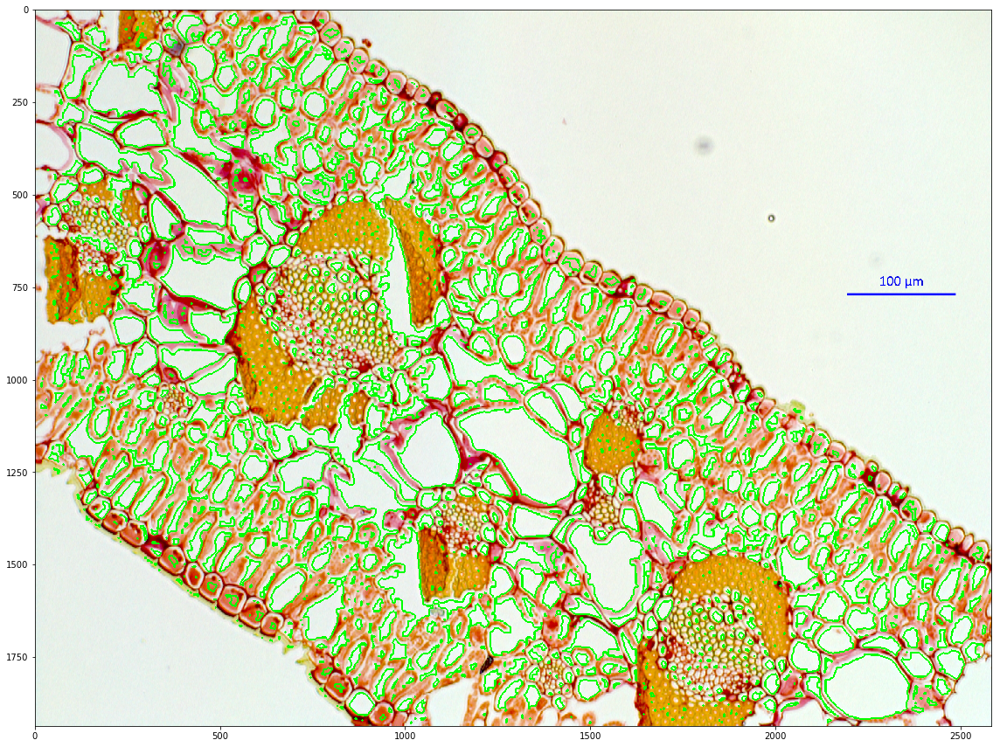

In [151]:
contours, hierarchy = cv2.findContours(image=foreground_closed.copy(), mode=cv2.RETR_EXTERNAL, 
                                       method=cv2.CHAIN_APPROX_SIMPLE)

fig, ax = plt.subplots(figsize=(16,16))
drawn_contours = cv2.drawContours(image=image.copy(), contours=contours, 
                                  contourIdx=-1, color=(0,255,0), thickness=3)
plt.imshow(drawn_contours)
plt.tight_layout()

In [152]:
rho = 1  # distance resolution in pixels of the Hough grid
theta = np.pi / 180  # angular resolution in radians of the Hough grid
threshold = 15  # minimum number of votes (intersections in Hough grid cell)
min_line_length = 50  # minimum number of pixels making up a line
max_line_gap = 0  # maximum gap in pixels between connectable line segments
line_image = np.copy(image) * 0  # creating a blank to draw lines on

# Run Hough on edge detected image
# Output "lines" is an array containing endpoints of detected line segments
lines = cv2.HoughLinesP(image=edges, rho=rho, theta=theta, threshold=threshold, 
                        lines=np.array([]), minLineLength=min_line_length, maxLineGap=max_line_gap)

for line in lines:
    for x1,y1,x2,y2 in line:
        cv2.line(line_image,(x1,y1),(x2,y2),(255,0,0),5)

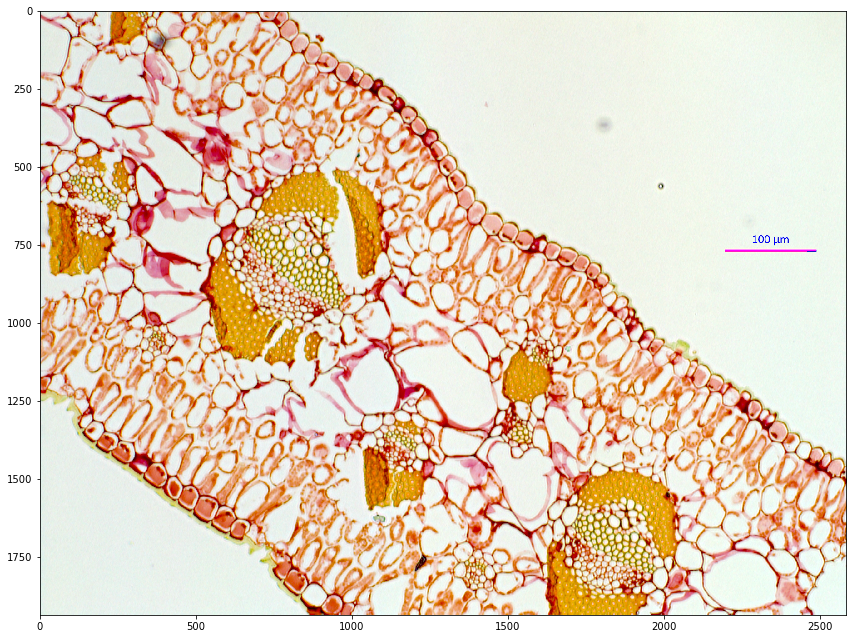

In [153]:
# Draw the lines on the  image
lines_edges = cv2.addWeighted(src1=img.copy(), alpha=1.0, src2=line_image, beta=10, gamma=0)

fig, ax = plt.subplots(figsize=(12,12))
ax.imshow(lines_edges)
plt.tight_layout()

In [154]:
scalebar = None
scalebar_length = 0.0

for l in lines:
    x1 = l[0][0]
    x2 = l[0][2]
    y1 = l[0][1]
    y2 = l[0][3]
    
    length = np.sqrt((x2-x1)**2+(y2-y1)**2)
        
    if length>scalebar_length:
        scalebar_length = length
        scalebar = l[0]

    print(scalebar, scalebar_length)

[2193  766 2485  766] 292.0
[2193  766 2485  766] 292.0


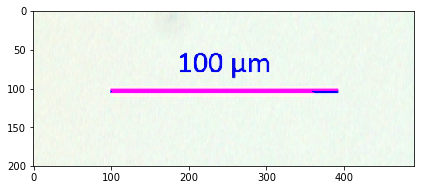

In [155]:
fig, ax = plt.subplots(figsize=(6,6))
ax.imshow(crop_img)
plt.tight_layout()

In [156]:
def px2area(scalebar, scalebar_img):
    
    scalebar_pixels = np.sqrt((scalebar[2]-scalebar[0])**2+(scalebar[3]-scalebar[1])**2)
    
    scalebar_length, scalebar_units = image_to_string(image=crop_img).split()
    scalebar_length = float(scalebar_length)
    
    pixel_area = (scalebar_length**2)/(scalebar_pixels**2)
    converstion_units = "{}^2/pixel".format(scalebar_units)
    
    return pixel_area, converstion_units

In [157]:
conversion_factor, units = px2area(scalebar=scalebar, scalebar_img=crop_img)
contour_areas_pixels = []
for c in contours:
    if cv2.contourArea(c) < 200: continue
    contour_areas_pixels.append(cv2.contourArea(c))
contour_areas_metric = [c*conversion_factor for c in contour_areas_pixels]

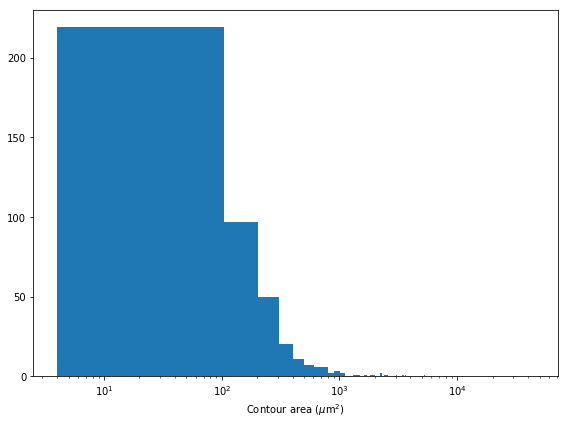

In [158]:
fig,ax = plt.subplots(figsize=(8,6))

binwidth=100

ax.hist(contour_areas_metric, bins=range(int(min(careas)), int(max(careas)) + binwidth, binwidth))
ax.set_xlabel("Contour area ($\mu$m$^2$)")
plt.semilogx()
plt.tight_layout()

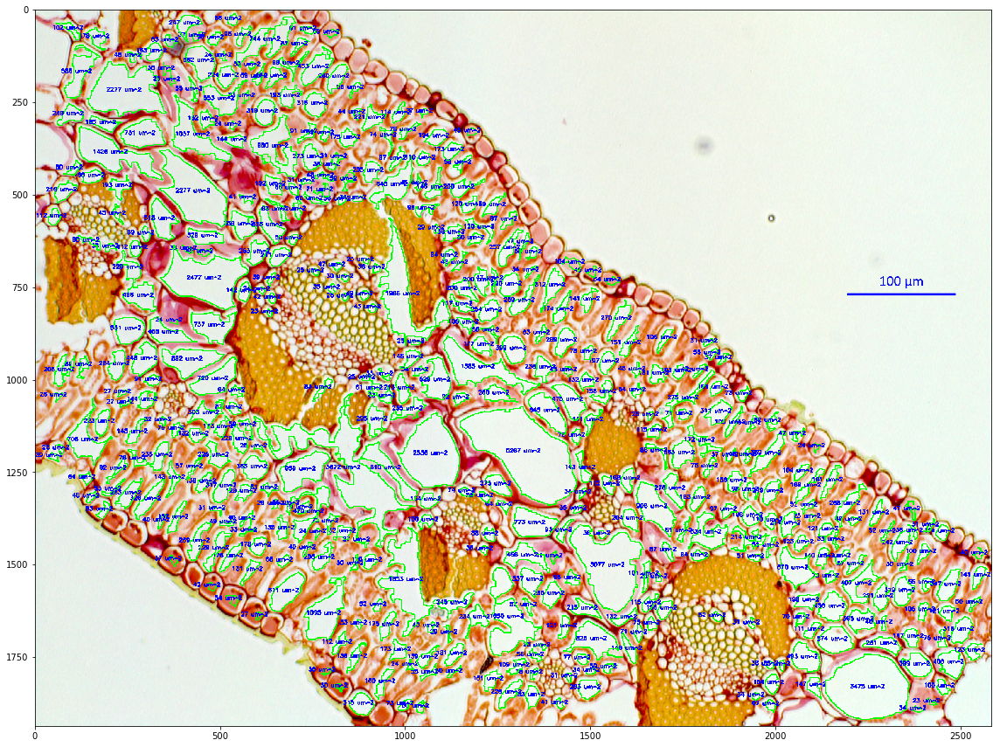

In [164]:
fig, ax = plt.subplots(figsize=(16,16))
mirror_image = image.copy()
# loop over the contours
for i,c in enumerate(contours):
    # Skip small contours
    if cv2.contourArea(c) < 200: 
        continue
    # Calculate area
    c_area_metric = np.round(conversion_factor*cv2.contourArea(c), decimals=1)
    
    # compute the center of the contour, then detect the name of the
    # shape using only the contour
    M = cv2.moments(c)
    cX = int((M["m10"] / M["m00"]))-50
    cY = int((M["m01"] / M["m00"]))

    # multiply the contour (x, y)-coordinates by the resize ratio,
    # then draw the contours and the name of the shape on the image
    c = c.astype("float")
    c = c.astype("int")
    cv2.drawContours(mirror_image, [c], -1, (0, 255, 0), 2)
    cv2.putText(img=mirror_image, text="{} um^2".format(int(c_area_metric)), org=(cX, cY), 
                fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.5, color=(0, 0, 255), thickness=2)
    
    # show the output image
ax.imshow(mirror_image)
plt.tight_layout()

In [166]:
#cv2.imwrite(filename="./First try.png", img=mirror_image)

True